In [1]:
#Importing libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O 
import os
import itertools
import warnings
warnings.filterwarnings("ignore")
import io

################# visualization #################
import matplotlib.pyplot as plt 
from PIL import  Image
import seaborn as sns 
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

In [2]:
Airline = pd.read_csv (r"C:\Users\Sai\Desktop\python\Machine Learning\practice\airline_passenger_satisfaction.csv")
Airline.head()

,Unnamed: 0,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,...,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [3]:
Airline.shape

(129880, 24)

In [4]:
Airline.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         129880 non-null  int64  
 1   Gender                             129880 non-null  object 
 2   customer_type                      129880 non-null  object 
 3   age                                129880 non-null  int64  
 4   type_of_travel                     129880 non-null  object 
 5   customer_class                     129880 non-null  object 
 6   flight_distance                    129880 non-null  int64  
 7   inflight_wifi_service              129880 non-null  int64  
 8   departure_arrival_time_convenient  129880 non-null  int64  
 9   ease_of_online_booking             129880 non-null  int64  
 10  gate_location                      129880 non-null  int64  
 11  food_and_drink                     1298

In [5]:
Airline.describe()

,Unnamed: 0,age,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes
count,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000
mean,64939.500000,39.427957,1190.316392,2.728696,3.057599,2.756876,2.976925,3.204774,3.252633,3.441361,3.358077,3.383023,3.350878,3.632114,3.306267,3.642193,3.286326,14.713713,15.091129
std,37493.270818,15.119360,997.452477,1.329340,1.526741,1.401740,1.278520,1.329933,1.350719,1.319289,1.334049,1.287099,1.316252,1.180025,1.266185,1.176669,1.313682,38.071126,38.465650
min,0.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32469.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,64939.500000,40.000000,844.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,97409.250000,51.000000,1744.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,129879.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


### Drop Irrelavant column

In [6]:
Airline = Airline.drop(['Unnamed: 0'], axis=1)
Airline

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,...,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,Male,disloyal Customer,34,Business travel,Business,526,3,3,3,1,...,4,3,2,4,4,5,4,0,0.0,neutral or dissatisfied
129876,Male,Loyal Customer,23,Business travel,Business,646,4,4,4,4,...,4,4,5,5,5,5,4,0,0.0,satisfied
129877,Female,Loyal Customer,17,Personal Travel,Eco,828,2,5,1,5,...,2,4,3,4,5,4,2,0,0.0,neutral or dissatisfied
129878,Male,Loyal Customer,14,Business travel,Business,1127,3,3,3,3,...,4,3,2,5,4,5,4,0,0.0,satisfied


In [7]:
Airline.isnull().sum()

Gender                                 0
customer_type                          0
age                                    0
type_of_travel                         0
customer_class                         0
flight_distance                        0
inflight_wifi_service                  0
departure_arrival_time_convenient      0
ease_of_online_booking                 0
gate_location                          0
food_and_drink                         0
online_boarding                        0
seat_comfort                           0
inflight_entertainment                 0
onboard_service                        0
leg_room_service                       0
baggage_handling                       0
checkin_service                        0
inflight_service                       0
cleanliness                            0
departure_delay_in_minutes             0
arrival_delay_in_minutes             393
satisfaction                           0
dtype: int64

In [8]:
Airline['arrival_delay_in_minutes'].fillna(Airline['arrival_delay_in_minutes'].mean(),inplace=True)

In [9]:
Airline.isnull().sum()

Gender                               0
customer_type                        0
age                                  0
type_of_travel                       0
customer_class                       0
flight_distance                      0
inflight_wifi_service                0
departure_arrival_time_convenient    0
ease_of_online_booking               0
gate_location                        0
food_and_drink                       0
online_boarding                      0
seat_comfort                         0
inflight_entertainment               0
onboard_service                      0
leg_room_service                     0
baggage_handling                     0
checkin_service                      0
inflight_service                     0
cleanliness                          0
departure_delay_in_minutes           0
arrival_delay_in_minutes             0
satisfaction                         0
dtype: int64

<AxesSubplot:>

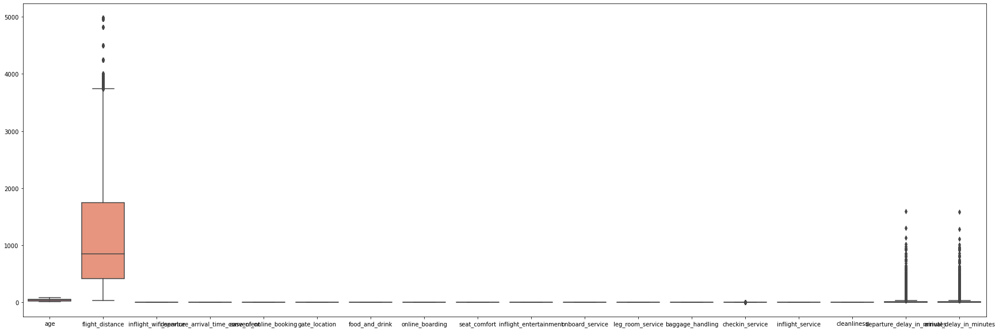

In [10]:
plt.figure(figsize=(30,10))
sns.boxplot(data=Airline)

In [11]:
i=Airline.select_dtypes(include=[np.number]).columns
i

Index(['age', 'flight_distance', 'inflight_wifi_service',
       'departure_arrival_time_convenient', 'ease_of_online_booking',
       'gate_location', 'food_and_drink', 'online_boarding', 'seat_comfort',
       'inflight_entertainment', 'onboard_service', 'leg_room_service',
       'baggage_handling', 'checkin_service', 'inflight_service',
       'cleanliness', 'departure_delay_in_minutes',
       'arrival_delay_in_minutes'],
      dtype='object')

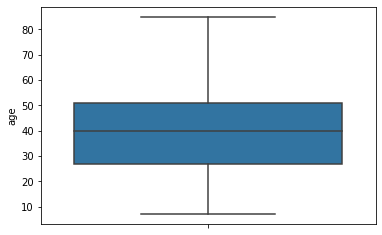

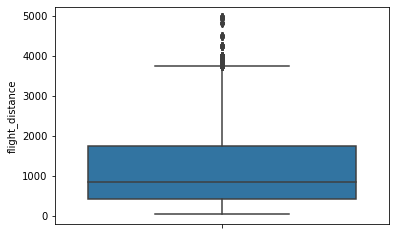

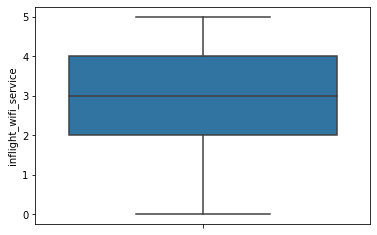

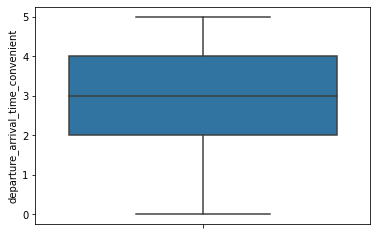

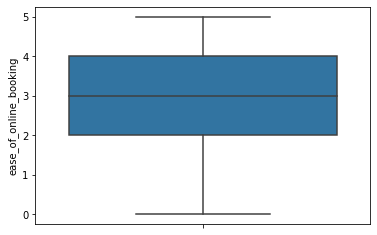

...

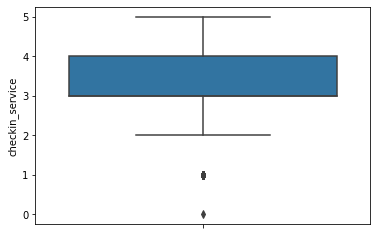

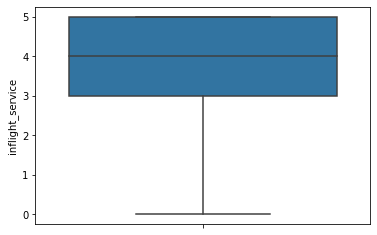

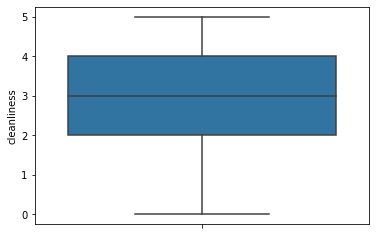

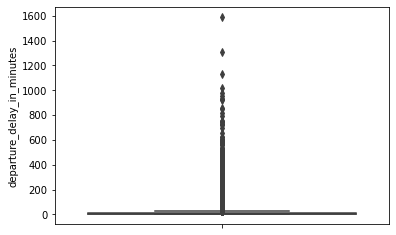

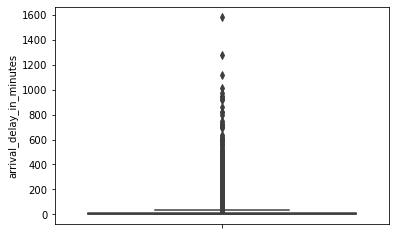

In [12]:
import matplotlib.pyplot as plt
i=Airline.select_dtypes(include=[np.number]).columns

for j in i:
    plt.figure()
    sns.boxplot(y=Airline[j])

In [13]:
def outliers(df,colname):
    q1 = df[colname].quantile(0.25)
    q3 = df[colname].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    low_limit = q1-1.5*iqr #acceptable range
    upper_limit = q3+1.5*iqr #acceptable range
    df[colname]=(np.where(df[colname] > upper_limit,upper_limit,df[colname])) 
    df[colname]=np.where(df[colname] < low_limit,low_limit,df[colname])
    return df[colname]

In [14]:
for j in i:
    print(outliers(Airline,j))

0         13.0
1         25.0
2         26.0
3         25.0
4         61.0
          ... 
129875    34.0
129876    23.0
129877    17.0
129878    14.0
129879    42.0
Name: age, Length: 129880, dtype: float64
0          460.0
1          235.0
2         1142.0
3          562.0
4          214.0
           ...  
129875     526.0
129876     646.0
129877     828.0
129878    1127.0
129879     264.0
Name: flight_distance, Length: 129880, dtype: float64
0         3.0
1         3.0
2         2.0
3         2.0
4         3.0
         ... 
129875    3.0
129876    4.0
129877    2.0
129878    3.0
129879    2.0
Name: inflight_wifi_service, Length: 129880, dtype: float64
0         4.0
1         2.0
2         2.0
3         5.0
4         3.0
         ... 
129875    3.0
129876    4.0
129877    5.0
129878    3.0
129879    5.0
Name: departure_arrival_time_convenient, Length: 129880, dtype: float64
0         3.0
1         3.0
2         2.0
3         5.0
4         3.0
         ... 
129875    3.0
129876    4.0


<AxesSubplot:>

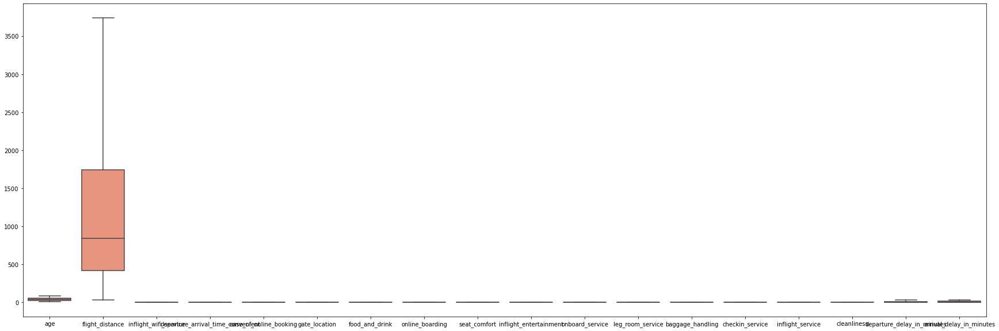

In [15]:
plt.figure(figsize=(30,10))
sns.boxplot(data=Airline)

## EDA

#### Flight Satisfaction 
neutral or dissatisfied =0

satisfied =1

In [16]:
Airline.satisfaction.value_counts()

neutral or dissatisfied    73452
satisfied                  56428
Name: satisfaction, dtype: int64

In [17]:
from sklearn.preprocessing import LabelEncoder
Airline.satisfaction=(LabelEncoder().fit_transform(Airline.satisfaction)) 

In [18]:
Airline.satisfaction.value_counts()

0    73452
1    56428
Name: satisfaction, dtype: int64

<AxesSubplot:xlabel='satisfaction', ylabel='count'>

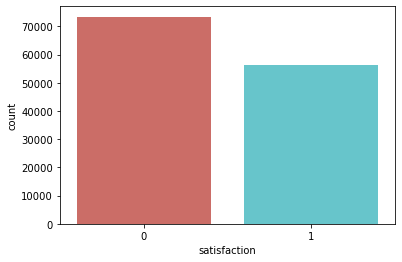

In [19]:
sns.countplot(x='satisfaction',data=Airline,palette='hls')

In [20]:
Airline.groupby('satisfaction').mean()

,age,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes
satisfaction,,,,,,,,,,,,,,,,,,
0,37.650997,928.202745,2.398423,3.130221,2.549393,2.980055,2.958422,2.658621,3.037998,2.892433,3.019537,2.990443,3.374912,3.126368,3.389601,2.932800,8.110467,8.967689
1,41.741015,1523.864943,3.158609,2.963068,3.026955,2.972850,3.525448,4.025856,3.966417,3.964202,3.856171,3.820054,3.966914,3.683198,3.970990,3.746509,6.430992,6.636902


* most of the people who are neutral or dissatisfied are by Flight for the arrival delay of Flight

In [21]:
import plotly.express as px

fig = px.pie(Airline,names='satisfaction',color='satisfaction',
             color_discrete_map={'neutral or dissatisfied':'red',
                                 'satisfied':'green'})
fig.show()

* rate of not satisfied peoples is 56.6%
* and rate of satisfied peoples are 43.4%

#### Reject Airline data = Bad Airline service

In [22]:
Airline_Good= Airline[Airline["satisfaction"] == 1] 

Airline_Good

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,...,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
2,Female,Loyal Customer,26.0,Business travel,Business,1142.0,2.0,2.0,2.0,2.0,...,5.0,4.0,3.0,4.0,4.0,4.0,5.0,0.0,0.0,1
4,Male,Loyal Customer,61.0,Business travel,Business,214.0,3.0,3.0,3.0,3.0,...,3.0,3.0,4.0,4.0,3.0,3.0,3.0,0.0,0.0,1
7,Female,Loyal Customer,52.0,Business travel,Business,2035.0,4.0,3.0,4.0,4.0,...,5.0,5.0,5.0,5.0,4.0,5.0,4.0,4.0,0.0,1
13,Male,Loyal Customer,33.0,Personal Travel,Eco,946.0,4.0,2.0,4.0,3.0,...,4.0,4.0,5.0,2.0,2.0,2.0,4.0,0.0,0.0,1
16,Female,Loyal Customer,26.0,Business travel,Business,2123.0,3.0,3.0,3.0,3.0,...,4.0,5.0,3.0,4.0,5.0,4.0,4.0,30.0,32.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129860,Female,Loyal Customer,29.0,Business travel,Business,2864.0,5.0,5.0,5.0,5.0,...,3.0,5.0,5.0,5.0,3.0,5.0,3.0,0.0,0.0,1
129865,Male,Loyal Customer,51.0,Business travel,Business,2296.0,3.0,3.0,3.0,3.0,...,5.0,5.0,5.0,5.0,3.0,5.0,3.0,2.0,0.0,1
129873,Male,Loyal Customer,52.0,Business travel,Business,280.0,3.0,3.0,3.0,3.0,...,4.0,4.0,4.0,4.0,3.0,4.0,3.0,0.0,0.0,1
129876,Male,Loyal Customer,23.0,Business travel,Business,646.0,4.0,4.0,4.0,4.0,...,4.0,4.0,5.0,5.0,5.0,5.0,4.0,0.0,0.0,1


In [23]:
fig = px.sunburst(Airline_Good, path=["Gender",'customer_type','type_of_travel',
                                    'customer_class'])
fig.show()

### 5. Breaking Data into Two Part
* Quantitative Variable
* Qualitative Variable

In [24]:
# Qualitative Variable
Quantitative_Variable = Airline[Airline.select_dtypes(include=[np.number]).columns.tolist()]
Quantitative_Variable.head(3)

,age,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,food_and_drink,online_boarding,seat_comfort,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,13.0,460.0,3.0,4.0,3.0,1.0,5.0,3.0,5.0,5.0,4.0,3.0,4.0,4.0,5.0,5.0,25.0,18.0,0
1,25.0,235.0,3.0,2.0,3.0,3.0,1.0,3.0,1.0,1.0,1.0,5.0,3.0,1.5,4.0,1.0,1.0,6.0,0
2,26.0,1142.0,2.0,2.0,2.0,2.0,5.0,5.0,5.0,5.0,4.0,3.0,4.0,4.0,4.0,5.0,0.0,0.0,1


In [25]:
Qualitative_Variable = Airline[Airline.select_dtypes(include=['object']).columns.tolist()]
Qualitative_Variable.head(3)

,Gender,customer_type,type_of_travel,customer_class
0,Male,Loyal Customer,Personal Travel,Eco Plus
1,Male,disloyal Customer,Business travel,Business
2,Female,Loyal Customer,Business travel,Business


### Converting qualitative Variable into number

In [26]:
from sklearn.preprocessing import LabelEncoder
Qualitative_Variable=Qualitative_Variable.apply(LabelEncoder().fit_transform) # label in ascending order
Qualitative_Variable.head()

,Gender,customer_type,type_of_travel,customer_class
0,1,0,1,2
1,1,1,0,0
2,0,0,0,0
3,0,0,0,0
4,1,0,0,0


#### Combining the data set

In [27]:
Airline_final = pd.concat([Qualitative_Variable, Quantitative_Variable],axis=1)
Airline_final.head()

,Gender,customer_type,type_of_travel,customer_class,age,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,...,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,1,0,1,2,13.0,460.0,3.0,4.0,3.0,1.0,...,5.0,4.0,3.0,4.0,4.0,5.0,5.0,25.0,18.0,0
1,1,1,0,0,25.0,235.0,3.0,2.0,3.0,3.0,...,1.0,1.0,5.0,3.0,1.5,4.0,1.0,1.0,6.0,0
2,0,0,0,0,26.0,1142.0,2.0,2.0,2.0,2.0,...,5.0,4.0,3.0,4.0,4.0,4.0,5.0,0.0,0.0,1
3,0,0,0,0,25.0,562.0,2.0,5.0,5.0,5.0,...,2.0,2.0,5.0,3.0,1.5,4.0,2.0,11.0,9.0,0
4,1,0,0,0,61.0,214.0,3.0,3.0,3.0,3.0,...,3.0,3.0,4.0,4.0,3.0,3.0,3.0,0.0,0.0,1


## Splitting the data in Training and Test set

In [28]:
Airline.head()

,Gender,customer_type,age,type_of_travel,customer_class,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,...,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
0,Male,Loyal Customer,13.0,Personal Travel,Eco Plus,460.0,3.0,4.0,3.0,1.0,...,5.0,4.0,3.0,4.0,4.0,5.0,5.0,25.0,18.0,0
1,Male,disloyal Customer,25.0,Business travel,Business,235.0,3.0,2.0,3.0,3.0,...,1.0,1.0,5.0,3.0,1.5,4.0,1.0,1.0,6.0,0
2,Female,Loyal Customer,26.0,Business travel,Business,1142.0,2.0,2.0,2.0,2.0,...,5.0,4.0,3.0,4.0,4.0,4.0,5.0,0.0,0.0,1
3,Female,Loyal Customer,25.0,Business travel,Business,562.0,2.0,5.0,5.0,5.0,...,2.0,2.0,5.0,3.0,1.5,4.0,2.0,11.0,9.0,0
4,Male,Loyal Customer,61.0,Business travel,Business,214.0,3.0,3.0,3.0,3.0,...,3.0,3.0,4.0,4.0,3.0,3.0,3.0,0.0,0.0,1


In [29]:
from sklearn.model_selection import train_test_split
X = Airline_final.drop('satisfaction', axis = 1)
Y = Airline_final[['satisfaction']]
# Split X and y into X_
X_train, X_test, y_train, y_test= train_test_split(X, Y, test_size=0.20, random_state=43)

## Model building

### Hypothesis
H0 :- There is no log linear relationship between satisfaction and all independent Variable
    
Vs

H1 :- There is log linear relationship between satisfaction and all independent Variable
    
Alpha = 0.05 (5%)

### Logistics Regression

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logreg = LogisticRegression()
Airline=logreg.fit(X_train, y_train)

In [31]:
Airline.intercept_

array([-0.28288789])

In [32]:
Airline.coef_ 

array([[-9.21443724e-02, -3.09439615e-01, -6.20752515e-01,
        -8.06478894e-01, -3.10030883e-02,  1.52772184e-04,
         3.32042930e-01, -3.18025005e-01,  4.16551412e-03,
        -2.72277350e-01, -2.49308310e-01,  6.22989494e-01,
         8.23577751e-02,  3.37859350e-01,  1.99292178e-01,
         1.54807837e-01, -1.06522664e-01, -3.62412484e-02,
        -1.42701090e-01, -1.52209065e-03, -8.71570205e-03,
        -1.47502256e-02]])

In [33]:
Airline.n_features_in_

22

* We Reject Ho
* There is log linear relationship between satisfaction and all independent Variable

### Predictions on Train Dataset

In [34]:
train=pd.concat([X_train,y_train],axis=1)
train.head()

,Gender,customer_type,type_of_travel,customer_class,age,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,...,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
75983,0,0,1,1,55.0,2367.0,2.0,5.0,1.0,4.0,...,5.0,5.0,1.0,5.0,3.0,5.0,4.0,0.0,0.0,0
45453,1,1,0,1,44.0,209.0,2.0,4.0,2.0,2.0,...,5.0,1.0,5.0,3.0,3.0,2.0,5.0,8.0,30.0,0
86275,0,0,0,0,42.0,515.0,2.0,2.0,2.0,2.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,16.0,13.0,1
114690,0,0,0,0,34.0,1609.0,5.0,5.0,5.0,5.0,...,5.0,5.0,5.0,5.0,4.0,5.0,4.0,0.0,2.0,1
22859,1,1,0,0,59.0,184.0,4.0,4.0,4.0,3.0,...,1.0,4.0,5.0,4.0,5.0,4.0,1.0,0.0,0.0,1


In [36]:
train['Predicted']=Airline.predict(X_train)
train.head()

,Gender,customer_type,type_of_travel,customer_class,age,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,...,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction,Predicted
75983,0,0,1,1,55.0,2367.0,2.0,5.0,1.0,4.0,...,5.0,1.0,5.0,3.0,5.0,4.0,0.0,0.0,0,0
45453,1,1,0,1,44.0,209.0,2.0,4.0,2.0,2.0,...,1.0,5.0,3.0,3.0,2.0,5.0,8.0,30.0,0,0
86275,0,0,0,0,42.0,515.0,2.0,2.0,2.0,2.0,...,5.0,5.0,5.0,5.0,5.0,5.0,16.0,13.0,1,1
114690,0,0,0,0,34.0,1609.0,5.0,5.0,5.0,5.0,...,5.0,5.0,5.0,4.0,5.0,4.0,0.0,2.0,1,1
22859,1,1,0,0,59.0,184.0,4.0,4.0,4.0,3.0,...,4.0,5.0,4.0,5.0,4.0,1.0,0.0,0.0,1,0


### Model Performance Metrics

In [37]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(train['Predicted'], train['satisfaction'])
matrix

array([[48454,  8399],
       [10277, 36774]], dtype=int64)

In [40]:
48454+8399+10277+36774

103904

In [41]:
Accuracy_Train=((48454+36774)/(103904)*100)
print(Accuracy_Train)

82.02571604558054


Accuracy of Model is 82% , So we say Model good fit data

In [39]:
from sklearn.metrics import classification_report
print(classification_report(train['satisfaction'],train['Predicted']))

              precision    recall  f1-score   support

           0       0.85      0.83      0.84     58731
           1       0.78      0.81      0.80     45173

    accuracy                           0.82    103904
   macro avg       0.82      0.82      0.82    103904
weighted avg       0.82      0.82      0.82    103904



* Accuracy of Model is 82% , So we say Model good fit data
* Accuracy of Bad Airline Review Capture by Model is 83% ( Sensitivity )
* Accuracy of Good Airline Review Capture by Model is 81%(Specificity)

### Predictions on Test Dataset

In [42]:
test=pd.concat([X_test,y_test],axis=1)
test.head()

,Gender,customer_type,type_of_travel,customer_class,age,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,...,inflight_entertainment,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction
40075,0,0,1,1,46.0,1096.0,3.0,3.0,3.0,3.0,...,2.0,2.0,3.0,2.0,1.5,2.0,3.0,0.0,0.0,0
9734,0,1,0,1,43.0,173.0,2.0,0.0,2.0,1.0,...,5.0,4.0,2.0,1.0,3.0,2.0,5.0,30.0,32.5,0
95482,1,0,0,0,46.0,2723.0,4.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,4.0,5.0,0.0,11.0,1
96843,0,0,1,1,16.0,359.0,3.0,1.0,3.0,3.0,...,2.0,1.0,1.0,3.0,3.0,4.0,2.0,30.0,32.5,0
94178,1,0,1,1,37.0,264.0,2.0,1.0,2.0,4.0,...,2.0,1.0,3.0,3.0,3.0,3.0,2.0,0.0,0.0,0


In [44]:
test['Predicted']=Airline.predict(X_test)
test.head()

,Gender,customer_type,type_of_travel,customer_class,age,flight_distance,inflight_wifi_service,departure_arrival_time_convenient,ease_of_online_booking,gate_location,...,onboard_service,leg_room_service,baggage_handling,checkin_service,inflight_service,cleanliness,departure_delay_in_minutes,arrival_delay_in_minutes,satisfaction,Predicted
40075,0,0,1,1,46.0,1096.0,3.0,3.0,3.0,3.0,...,2.0,3.0,2.0,1.5,2.0,3.0,0.0,0.0,0,0
9734,0,1,0,1,43.0,173.0,2.0,0.0,2.0,1.0,...,4.0,2.0,1.0,3.0,2.0,5.0,30.0,32.5,0,0
95482,1,0,0,0,46.0,2723.0,4.0,4.0,4.0,4.0,...,4.0,4.0,4.0,4.0,4.0,5.0,0.0,11.0,1,1
96843,0,0,1,1,16.0,359.0,3.0,1.0,3.0,3.0,...,1.0,1.0,3.0,3.0,4.0,2.0,30.0,32.5,0,0
94178,1,0,1,1,37.0,264.0,2.0,1.0,2.0,4.0,...,1.0,3.0,3.0,3.0,3.0,2.0,0.0,0.0,0,0


### Model Performance Metrics on Test data

In [45]:
from sklearn.metrics import confusion_matrix
matrix = confusion_matrix(test['Predicted'],test['satisfaction'])
print(matrix)

[[12250  2092]
 [ 2471  9163]]


In [46]:
12250+2092+2471+9163

25976

In [47]:
Accuracy_test=((12250+9163)/(25976)*100)
Accuracy_test

82.43378503233755

Accuracy of Model is 82% , So we say Model good fit data

In [49]:
from sklearn.metrics import classification_report
print(classification_report(test['satisfaction'],test['Predicted']))

              precision    recall  f1-score   support

           0       0.85      0.83      0.84     14721
           1       0.79      0.81      0.80     11255

    accuracy                           0.82     25976
   macro avg       0.82      0.82      0.82     25976
weighted avg       0.83      0.82      0.82     25976



* Accuracy of Model is 82% , So we say Model good fit data
* Accuracy of Bad Airline Review Capture by Model is 83% ( Sensitivity )
* Accuracy of Good Airline Review Capture by Model is 81%(Specificity)

## Coefficient

* For future Prediction below 4 variable data is mandatory

* Note :- If anyone is not present output will not be reliable

In [51]:
Airline.intercept_,Airline.coef_

(array([-0.28288789]),
 array([[-9.21443724e-02, -3.09439615e-01, -6.20752515e-01,
         -8.06478894e-01, -3.10030883e-02,  1.52772184e-04,
          3.32042930e-01, -3.18025005e-01,  4.16551412e-03,
         -2.72277350e-01, -2.49308310e-01,  6.22989494e-01,
          8.23577751e-02,  3.37859350e-01,  1.99292178e-01,
          1.54807837e-01, -1.06522664e-01, -3.62412484e-02,
         -1.42701090e-01, -1.52209065e-03, -8.71570205e-03,
         -1.47502256e-02]]))